## Intall the Required Packages

In [85]:
from sklearn.impute import SimpleImputer

import pandas as pd 
import numpy as np

import seaborn as sns

import matplotlib.pyplot as plt
import sklearn.linear_model
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
from sklearn.metrics import classification_report
from sklearn.metrics import  precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import cross_val_score

In [2]:
##Expand the dataframe size to have a better visualisation

pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', None)

## 

# Problem identification

The hotel wants to build a classification model that can identify high-value guests before they arrive. 
Create a Python classification model that can predict whether the average daily rate for a booking will be "high" or "low." You should try to implement both the logistic regression and decision tree classification models. 
Note: The values in the average daily rate (adr) column are mapped to Low and High. If the daily average rate is less than or equal to 70, map it to Low; otherwise, map it to High. 





## Features Descriptions

1.	hotel	
2.	is_canceled	
3.	lead_time	
4.	arrival_date_year	
5.	arrival_date_month	
6.	arrival_date_week_number	
7.	arrival_date_day_of_month
8.	stays_in_weekend_nights
9.	stays_in_week_nights
10.	adults	
11.	children	
12.	babies	
13.	meal	
14.	country	
15.	market_segment	
16.	distribution_channel	
17.	is_repeated_guest	
18.	previous_cancellations	
19.	previous_bookings_not_canceled	
20.	reserved_room_type	
21.	assigned_room_type	
22.	booking_changes	
23.	deposit_type	
24.	agent	
25.	company	
26.	days_in_waiting_list
27.	customer_type	
28.	adr	
29.	required_car_parking_spaces
30.	total_of_special_requests	
31.	reservation_status	
32.	reservation_status_date


## Import the dataset

# 3 Data Understanding

## 3.1 Gathering the data

In [3]:
data = pd.read_csv("hotel_dataset.csv")

In [4]:
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,01/07/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,01/07/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,02/07/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,02/07/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,03/07/2015


In [5]:
data.shape

(119390, 32)

In [6]:
# Map adr column to Low or High
data['adr'] = data['adr'].apply(lambda x: 'Low' if x <= 70 else 'High')

# 

## 3.2 Describing the data

In [7]:
data.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

# 

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [9]:
data.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

## 3.3 Exploring the data

In [10]:
data.describe(include="all")

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
count,119390,119390.000000,119390.000000,119390.000000,119390,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390,118902,119390,119390,119390.000000,119390.000000,119390.000000,119390,119390,119390.000000,119390,103050.000000,6797.000000,119390.000000,119390,119390,119390.000000,119390.000000,119390,119390
unique,2,NaN,NaN,NaN,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,177,8,5,NaN,NaN,NaN,10,12,NaN,3,NaN,NaN,NaN,4,2,NaN,NaN,3,926
top,City Hotel,NaN,NaN,NaN,August,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BB,PRT,Online TA,TA/TO,NaN,NaN,NaN,A,A,NaN,No Deposit,NaN,NaN,NaN,Transient,High,NaN,NaN,Check-Out,21/10/2015
freq,79330,NaN,NaN,NaN,13877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92310,48590,56477,97870,NaN,NaN,NaN,85994,74053,NaN,104641,NaN,NaN,NaN,89613,88262,NaN,NaN,75166,1461
mean,NaN,0.370416,104.011416,2016.156554,NaN,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,NaN,NaN,NaN,NaN,0.031912,0.087118,0.137097,NaN,NaN,0.221124,NaN,86.693382,189.266735,2.321149,NaN,NaN,0.062518,0.571363,NaN,NaN
std,NaN,0.482918,106.863097,0.707476,NaN,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,NaN,NaN,NaN,NaN,0.175767,0.844336,1.497437,NaN,NaN,0.652306,NaN,110.774548,131.655015,17.594721,NaN,NaN,0.245291,0.792798,NaN,NaN
min,NaN,0.000000,0.000000,2015.000000,NaN,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,1.000000,6.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN
25%,NaN,0.000000,18.000000,2016.000000,NaN,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,9.000000,62.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN
50%,NaN,0.000000,69.000000,2016.000000,NaN,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,14.000000,179.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN
75%,NaN,1.000000,160.000000,2017.000000,NaN,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,NaN,229.000000,270.000000,0.000000,NaN,NaN,0.000000,1.000000,NaN,NaN


In [11]:
data.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,8.000000,5.000000


The description of the data doesn't show any unusual information. However, all the columns above (except the arrival_date_year column) seems to have a large difference between the 75% percentile and the max value. It looks like these features are right skewed. We will check that later again once we plot histograms and boxplots to better visualise the data distribution.

In [12]:
average_rate_counts = data['adr'].value_counts()

In [13]:
average_rate_counts

High    88262
Low     31128
Name: adr, dtype: int64

In [14]:
 hotel_counts = data['hotel'].value_counts()

In [15]:
hotel_counts

City Hotel      79330
Resort Hotel    40060
Name: hotel, dtype: int64

In [16]:
data['country'].value_counts()

PRT    48590
GBR    12129
FRA    10415
ESP     8568
DEU     7287
ITA     3766
IRL     3375
BEL     2342
BRA     2224
NLD     2104
USA     2097
CHE     1730
CN      1279
AUT     1263
SWE     1024
CHN      999
POL      919
ISR      669
RUS      632
NOR      607
ROU      500
FIN      447
DNK      435
AUS      426
AGO      362
LUX      287
MAR      259
TUR      248
HUN      230
ARG      214
JPN      197
CZE      171
IND      152
KOR      133
GRC      128
DZA      103
SRB      101
HRV      100
MEX       85
EST       83
IRN       83
LTU       81
ZAF       80
BGR       75
NZL       74
COL       71
UKR       68
MOZ       67
CHL       65
SVK       65
THA       59
SVN       57
ISL       57
LVA       55
ARE       51
CYP       51
TWN       51
SAU       48
PHL       40
TUN       39
SGP       39
IDN       35
NGA       34
EGY       32
URY       32
LBN       31
PER       29
HKG       29
MYS       28
ECU       27
VEN       26
BLR       26
CPV       24
GEO       22
JOR       21
KAZ       19
CRI       19

In [17]:
data['market_segment'].value_counts()

Online TA        56477
Offline TA/TO    24219
Groups           19811
Direct           12606
Corporate         5295
Complementary      743
Aviation           237
Undefined            2
Name: market_segment, dtype: int64

In [18]:
data['distribution_channel'].value_counts()

TA/TO        97870
Direct       14645
Corporate     6677
GDS            193
Undefined        5
Name: distribution_channel, dtype: int64

In [19]:
data['is_canceled'].value_counts()

0    75166
1    44224
Name: is_canceled, dtype: int64

## Plot histogram

array([[<AxesSubplot:title={'center':'is_canceled'}>,
        <AxesSubplot:title={'center':'lead_time'}>,
        <AxesSubplot:title={'center':'arrival_date_year'}>,
        <AxesSubplot:title={'center':'arrival_date_week_number'}>],
       [<AxesSubplot:title={'center':'arrival_date_day_of_month'}>,
        <AxesSubplot:title={'center':'stays_in_weekend_nights'}>,
        <AxesSubplot:title={'center':'stays_in_week_nights'}>,
        <AxesSubplot:title={'center':'adults'}>],
       [<AxesSubplot:title={'center':'children'}>,
        <AxesSubplot:title={'center':'babies'}>,
        <AxesSubplot:title={'center':'is_repeated_guest'}>,
        <AxesSubplot:title={'center':'previous_cancellations'}>],
       [<AxesSubplot:title={'center':'previous_bookings_not_canceled'}>,
        <AxesSubplot:title={'center':'booking_changes'}>,
        <AxesSubplot:title={'center':'agent'}>,
        <AxesSubplot:title={'center':'company'}>],
       [<AxesSubplot:title={'center':'days_in_waiting_list'}>,


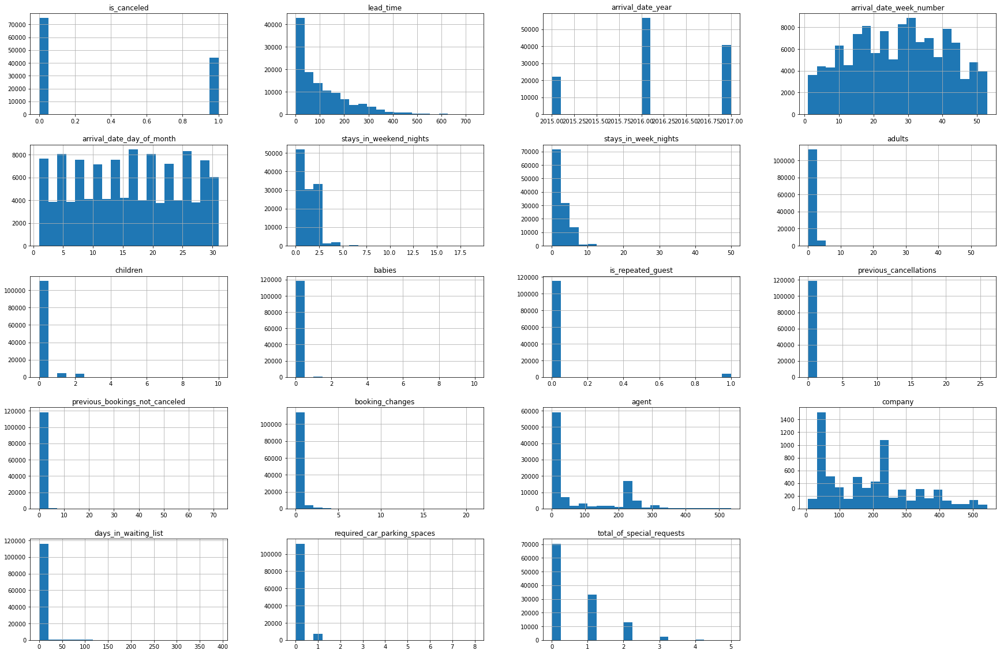

In [20]:
data.hist(bins=20, figsize=(30,20))

## Plot boxplot

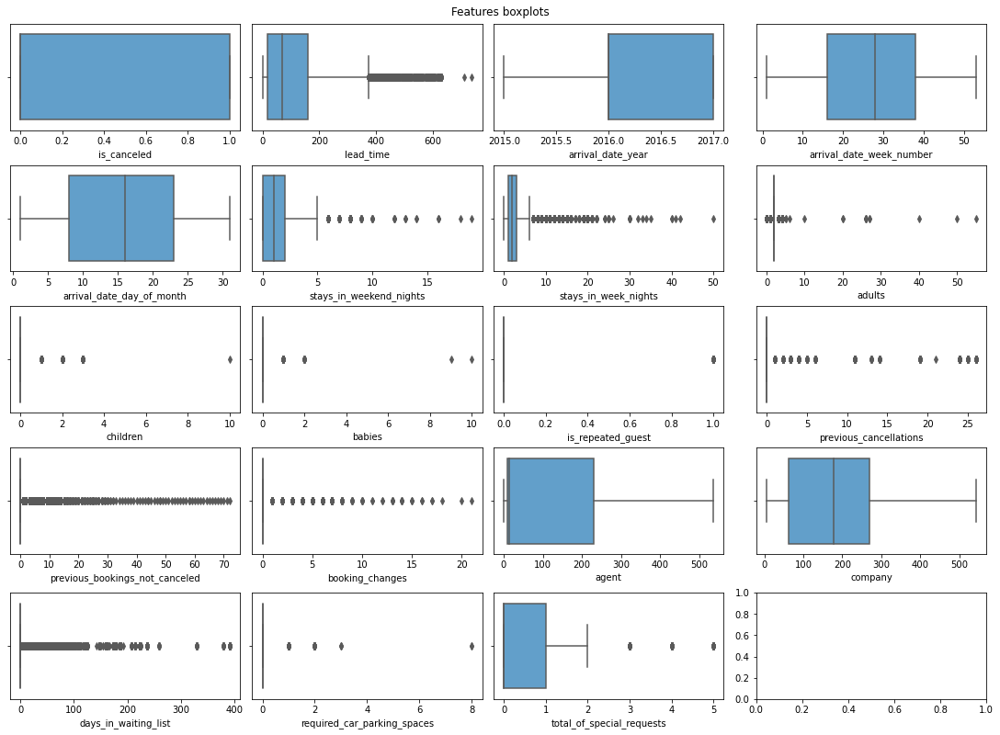

In [21]:
fig, ax = plt.subplots(nrows=5,ncols=4, figsize=(15,11), constrained_layout=True)
plt.suptitle("Features boxplots")
ax=ax.flatten()
int_cols= data.select_dtypes(exclude='object').columns
for x, i in enumerate(int_cols):
    sns.boxplot(x=data[i], ax=ax[x], color='#51A2DB')

## 

## Visualising the Unique Values

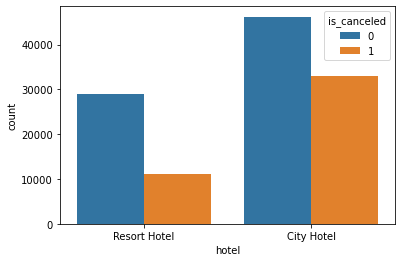

In [22]:

sns.countplot(x='hotel',hue='is_canceled', data=data);


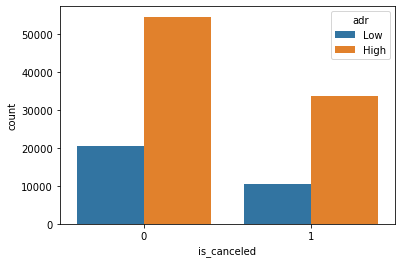

In [23]:
sns.countplot(x='is_canceled',hue='adr', data=data);

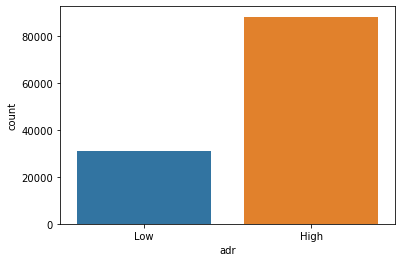

In [24]:
sns.countplot(x='adr', data=data);


In [25]:
data['adr'].value_counts()

High    88262
Low     31128
Name: adr, dtype: int64

In [56]:
data['is_canceled'].unique()
guest_country=data[data['is_canceled']==0 ] ['country'].value_counts().reset_index()
guest_country.columns=['country','Number of guests']
guest_country
total_guests = guest_country["Number of guests"].sum()
total_guests
guest_country["Guests in %"] = round(guest_country["Number of guests"] / total_guests *100, 2) 
guest_country

,country,Number of guests,Guests in %
0,PRT,21071,28.19
1,GBR,9676,12.95
2,FRA,8481,11.35
3,ESP,6391,8.55
4,DEU,6069,8.12
5,IRL,2543,3.40
6,ITA,2433,3.26
7,BEL,1868,2.50
8,NLD,1717,2.30
9,USA,1596,2.14


In [57]:
import plotly.express as px
map_guest=px.choropleth(guest_country,
             locations=guest_country['country'],
             color=guest_country['Number of guests'],
             hover_name=guest_country['country'],
             title="Home Country of Guest")
map_guest.show()

In [26]:
data.corr()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,required_car_parking_spaces,total_of_special_requests
is_canceled,1.000000,0.293123,0.016660,0.008148,-0.006130,-0.001791,0.024765,0.060017,0.005048,-0.032491,-0.084793,0.110133,-0.057358,-0.144381,-0.083114,-0.020642,0.054186,-0.195498,-0.234658
lead_time,0.293123,1.000000,0.040142,0.126871,0.002268,0.085671,0.165799,0.119519,-0.037622,-0.020915,-0.124410,0.086042,-0.073548,0.000149,-0.069741,0.151464,0.170084,-0.116451,-0.095712
arrival_date_year,0.016660,0.040142,1.000000,-0.540561,-0.000221,0.021497,0.030883,0.029635,0.054624,-0.013192,0.010341,-0.119822,0.029218,0.030872,0.063457,0.259095,-0.056497,-0.013684,0.108531
arrival_date_week_number,0.008148,0.126871,-0.540561,1.000000,0.066809,0.018208,0.015558,0.025909,0.005518,0.010395,-0.030131,0.035501,-0.020904,0.005508,-0.031201,-0.076760,0.022933,0.001920,0.026149
arrival_date_day_of_month,-0.006130,0.002268,-0.000221,0.066809,1.000000,-0.016354,-0.028174,-0.001566,0.014544,-0.000230,-0.006145,-0.027011,-0.000300,0.010613,0.001487,0.044858,0.022728,0.008683,0.003062
stays_in_weekend_nights,-0.001791,0.085671,0.021497,0.018208,-0.016354,1.000000,0.498969,0.091871,0.045793,0.018483,-0.087239,-0.012775,-0.042715,0.063281,0.140739,0.066749,-0.054151,-0.018554,0.072671
stays_in_week_nights,0.024765,0.165799,0.030883,0.015558,-0.028174,0.498969,1.000000,0.092976,0.044203,0.020191,-0.097245,-0.013992,-0.048743,0.096209,0.182382,0.182211,-0.002020,-0.024859,0.068192
adults,0.060017,0.119519,0.029635,0.025909,-0.001566,0.091871,0.092976,1.000000,0.030447,0.018146,-0.146426,-0.006738,-0.107983,-0.051673,-0.035594,0.207793,-0.008283,0.014785,0.122884
children,0.005048,-0.037622,0.054624,0.005518,0.014544,0.045793,0.044203,0.030447,1.000000,0.024030,-0.032859,-0.024730,-0.021072,0.048949,0.041066,0.030931,-0.033273,0.056253,0.081745
babies,-0.032491,-0.020915,-0.013192,0.010395,-0.000230,0.018483,0.020191,0.018146,0.024030,1.000000,-0.008943,-0.007501,-0.006550,0.083440,0.036184,0.019206,-0.010621,0.037383,0.097889


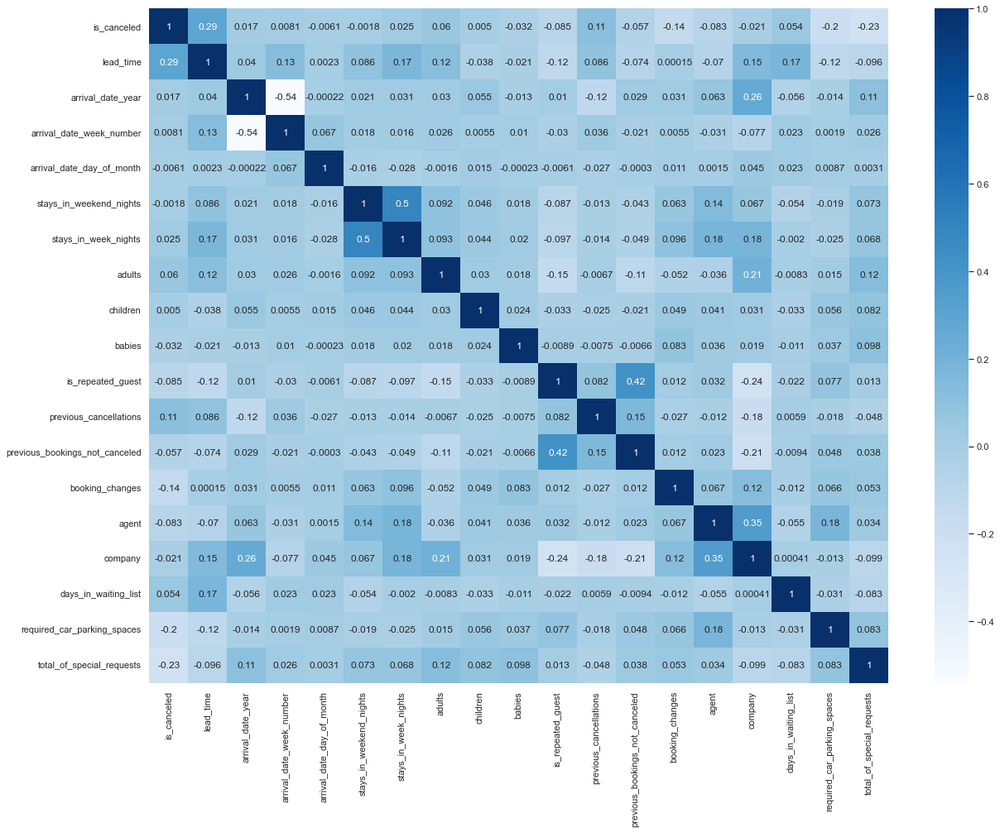

In [27]:
sns.set(rc={"figure.figsize":(20, 15)})
sns.heatmap(data.corr(), cmap='Blues', annot=True);

## 3.4 Data Quality¶

In [28]:
##Function to find out the percentage of null values in the dataframe

NullValues=data.isnull().sum()/len(data)

In [29]:
NullValues

hotel                             0.000000
is_canceled                       0.000000
lead_time                         0.000000
arrival_date_year                 0.000000
arrival_date_month                0.000000
arrival_date_week_number          0.000000
arrival_date_day_of_month         0.000000
stays_in_weekend_nights           0.000000
stays_in_week_nights              0.000000
adults                            0.000000
children                          0.000034
babies                            0.000000
meal                              0.000000
country                           0.004087
market_segment                    0.000000
distribution_channel              0.000000
is_repeated_guest                 0.000000
previous_cancellations            0.000000
previous_bookings_not_canceled    0.000000
reserved_room_type                0.000000
assigned_room_type                0.000000
booking_changes                   0.000000
deposit_type                      0.000000
agent      

In [30]:
## Checking if there are any missing values

data.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

As we can see, there are some missing values from the dataset. There are 112590 missing values within the company column,country column has 488 following the agent column with 16340 and chidren column with 4 missing values

## 

In [31]:
data.isnull().any()

hotel                             False
is_canceled                       False
lead_time                         False
arrival_date_year                 False
arrival_date_month                False
arrival_date_week_number          False
arrival_date_day_of_month         False
stays_in_weekend_nights           False
stays_in_week_nights              False
adults                            False
children                           True
babies                            False
meal                              False
country                            True
market_segment                    False
distribution_channel              False
is_repeated_guest                 False
previous_cancellations            False
previous_bookings_not_canceled    False
reserved_room_type                False
assigned_room_type                False
booking_changes                   False
deposit_type                      False
agent                              True
company                            True


## Duplicate Values

In [32]:
data.duplicated().sum()

32827

While checking for duplicated values, it has been found out that there are 31994 duplicated values through the dataset

# 4 Preparing data for machine learning¶

Based on the previous exploration, some features will be dropped before running our ML model. The reasons for dropping a feature in this example are as follows: • It does not add any value for the prediction task, for instance the company column is containing over of the 50% of missing values within the dataset. 

In [33]:
##Creating a new dataframe to prepare for machine learning models
data2 = pd.DataFrame(data)

In [34]:
data2 = data2.drop(['company'], axis=1)

In [35]:
data2.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,0,Transient,Low,0,0,Check-Out,01/07/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,0,Transient,Low,0,0,Check-Out,01/07/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,0,Transient,High,0,0,Check-Out,02/07/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,High,0,0,Check-Out,02/07/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,High,0,1,Check-Out,03/07/2015


In [36]:
data2.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

## Cleaning data

In [37]:
data2.isna().sum()

hotel                                 0
is_canceled                           0
lead_time                             0
arrival_date_year                     0
arrival_date_month                    0
arrival_date_week_number              0
arrival_date_day_of_month             0
stays_in_weekend_nights               0
stays_in_week_nights                  0
adults                                0
children                              4
babies                                0
meal                                  0
country                             488
market_segment                        0
distribution_channel                  0
is_repeated_guest                     0
previous_cancellations                0
previous_bookings_not_canceled        0
reserved_room_type                    0
assigned_room_type                    0
booking_changes                       0
deposit_type                          0
agent                             16340
days_in_waiting_list                  0


In [38]:
data2.fillna({'children':'0'}, inplace=True) ## This function is used to replace a null value based on condition

In [39]:
data2.dropna(subset=['country'], inplace=True)

In [40]:
data2.dropna(subset=['agent'], inplace=True)

In [41]:
data2.isna().sum()


hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

All the missing values have been fixed and removed from the dataset

### Removing the duplicated data

In [42]:
data2.duplicated().any()

True

In [43]:
data2.duplicated().sum()

28511

In [44]:
data2.drop_duplicates(keep=False, inplace=True)

In [45]:
data2.duplicated().any()

False

In [46]:
data2.duplicated().sum()

0

In [47]:
data2.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,High,0,0,Check-Out,02/07/2015
7,Resort Hotel,0,9,2015,July,27,1,0,2,2,0.0,0,FB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,303.0,0,Transient,High,0,1,Check-Out,03/07/2015
8,Resort Hotel,1,85,2015,July,27,1,0,3,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,High,0,1,Canceled,06/05/2015
9,Resort Hotel,1,75,2015,July,27,1,0,3,2,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,15.0,0,Transient,High,0,0,Canceled,22/04/2015
10,Resort Hotel,1,23,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,240.0,0,Transient,High,0,0,Canceled,23/06/2015


In [48]:
data2['reservation_status'].value_counts()

Check-Out    47539
Canceled     18585
No-Show        758
Name: reservation_status, dtype: int64

In [49]:
data2['market_segment'].value_counts()

Online TA        47220
Offline TA/TO    11557
Direct            5818
Groups            1738
Corporate          431
Complementary       95
Aviation            23
Name: market_segment, dtype: int64

In [50]:
data2['meal'].value_counts()

BB           50775
SC            8355
HB            7231
Undefined      269
FB             252
Name: meal, dtype: int64

In [51]:
data2['country'].value_counts()

PRT    16893
GBR     8573
FRA     7554
ESP     6076
DEU     4511
IRL     2623
ITA     2557
BEL     1738
BRA     1692
USA     1626
NLD     1619
CHE     1358
CN       926
AUT      735
CHN      686
SWE      669
POL      662
RUS      502
NOR      442
ROU      408
FIN      359
DNK      328
AUS      317
ISR      309
AGO      247
LUX      237
MAR      193
HUN      171
TUR      171
ARG      171
JPN      159
IND      125
CZE      107
KOR      102
GRC       87
HRV       73
IRN       71
ZAF       69
EST       69
DZA       67
LTU       64
COL       64
MEX       61
BGR       61
CHL       58
UKR       57
NZL       50
LVA       46
SRB       45
ARE       43
SAU       41
SVK       39
TWN       37
MOZ       37
TUN       34
THA       31
SGP       29
PHL       29
SVN       29
EGY       29
NGA       27
LBN       24
URY       23
ISL       22
ECU       22
MYS       20
CYP       20
IDN       20
BLR       20
PER       19
CPV       19
HKG       19
KAZ       18
JOR       17
OMN       17
GEO       16
KWT       16

# 

## Encoding the data

In [52]:
data2.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,High,0,0,Check-Out,02/07/2015
7,Resort Hotel,0,9,2015,July,27,1,0,2,2,0.0,0,FB,PRT,Direct,Direct,0,0,0,C,C,0,No Deposit,303.0,0,Transient,High,0,1,Check-Out,03/07/2015
8,Resort Hotel,1,85,2015,July,27,1,0,3,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,High,0,1,Canceled,06/05/2015
9,Resort Hotel,1,75,2015,July,27,1,0,3,2,0.0,0,HB,PRT,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,15.0,0,Transient,High,0,0,Canceled,22/04/2015
10,Resort Hotel,1,23,2015,July,27,1,0,4,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,240.0,0,Transient,High,0,0,Canceled,23/06/2015


#### Label Encoder

In [53]:
cat_cols = ["arrival_date_month","meal","country", "market_segment", "distribution_channel", "reserved_room_type", "assigned_room_type", "deposit_type", "customer_type", "reservation_status_date"]
for col in cat_cols:
    label_enc = LabelEncoder()
    data2[col] = label_enc.fit_transform(data2[col])


#### One Hot Encoder

In [54]:
data2 = pd.get_dummies(data2, columns=["hotel","adr","reservation_status"],drop_first=True)

In [55]:
data2.head()

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,required_car_parking_spaces,total_of_special_requests,reservation_status_date,hotel_Resort Hotel,adr_Low,reservation_status_Check-Out,reservation_status_No-Show
3,0,13,2015,5,27,1,0,1,1,0.0,0,0,59,2,0,0,0,0,0,0,0,0,304.0,0,2,0,0,45,1,0,1,0
7,0,9,2015,5,27,1,0,2,2,0.0,0,1,132,3,1,0,0,0,2,2,0,0,303.0,0,2,0,1,75,1,0,1,0
8,1,85,2015,5,27,1,0,3,2,0.0,0,0,132,6,3,0,0,0,0,0,0,0,240.0,0,2,0,1,164,1,0,0,0
9,1,75,2015,5,27,1,0,3,2,0.0,0,2,132,5,3,0,0,0,3,3,0,0,15.0,0,2,0,0,640,1,0,0,0
10,1,23,2015,5,27,1,0,4,2,0.0,0,0,132,6,3,0,0,0,4,4,0,0,240.0,0,2,0,0,677,1,0,0,0


In [58]:
data2.shape

(66882, 32)

In [59]:
data2.columns

Index(['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'required_car_parking_spaces',
       'total_of_special_requests', 'reservation_status_date',
       'hotel_Resort Hotel', 'adr_Low', 'reservation_status_Check-Out',
       'reservation_status_No-Show'],
      dtype='object')

## 

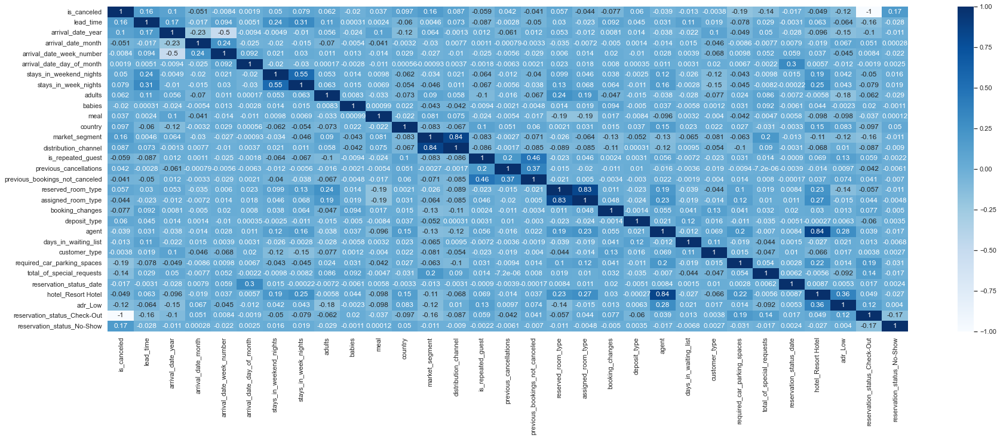

In [88]:
sns.set(rc={"figure.figsize":(30, 10)})
sns.heatmap(data2.corr(), cmap='Blues', annot=True);

# b Model Feature Selection:

In [61]:
corr_matrix = data2.corr()

corr_matrix['adr_Low'].sort_values(ascending=False)

adr_Low                           1.000000
hotel_Resort Hotel                0.360320
agent                             0.280033
is_repeated_guest                 0.132372
reservation_status_Check-Out      0.118026
country                           0.082961
previous_bookings_not_canceled    0.073668
arrival_date_month                0.067337
stays_in_week_nights              0.043416
stays_in_weekend_nights           0.042148
days_in_waiting_list              0.020653
customer_type                     0.016819
required_car_parking_spaces       0.013857
booking_changes                   0.012834
distribution_channel              0.010379
previous_cancellations            0.009657
deposit_type                      0.006252
reservation_status_date           0.005326
reservation_status_No-Show        0.003989
babies                           -0.002303
arrival_date_day_of_month        -0.011519
assigned_room_type               -0.015073
arrival_date_week_number         -0.044529
lead_time  

In [62]:
features = ['is_canceled', 'lead_time', 'arrival_date_year', 'arrival_date_month',
       'arrival_date_week_number', 'arrival_date_day_of_month',
       'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children',
       'babies', 'meal', 'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'days_in_waiting_list', 'customer_type', 'required_car_parking_spaces',
       'total_of_special_requests', 'reservation_status_date',
       'hotel_Resort Hotel', 'reservation_status_Check-Out',
       'reservation_status_No-Show']

In [63]:
avg_scaled= pd.DataFrame(data2['adr_Low'])

avg_scaled



,adr_Low
3,0
7,0
8,0
9,0
10,0
11,0
12,0
13,0
14,0
15,0


In [64]:
# Separating out the features
x_data =data2[features].values
x_data


array([[0, 13, 2015, ..., 1, 1, 0],
       [0, 9, 2015, ..., 1, 1, 0],
       [1, 85, 2015, ..., 1, 0, 0],
       ...,
       [0, 34, 2017, ..., 0, 1, 0],
       [0, 109, 2017, ..., 0, 1, 0],
       [0, 205, 2017, ..., 0, 1, 0]], dtype=object)

In [65]:
# Separating out the target
y_data = avg_scaled ['adr_Low'].values
y_data

array([0, 0, 0, ..., 0, 0, 0], dtype=uint8)

# 

# C. Model design and training¶

## Split dataset into training and testing sets

In [70]:

X_train, X_test, y_train, y_test = train_test_split(x_data,y_data, test_size=0.3, random_state=123)

In [71]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(46817, 31) (46817,)
(20065, 31) (20065,)


## Step 1 Training the Logistic Regressor Model

In [74]:
# Train Logistic regression model
Logistic_model = LogisticRegression(max_iter=3000)

In [75]:

Logistic_model.fit(X_train, y_train)


LogisticRegression(max_iter=3000)

# 

In [76]:
#Prediction using trained Logistic Regression
y_pred = Logistic_model.predict(X_test)

In [77]:
y_pred

array([0, 0, 0, ..., 1, 1, 0], dtype=uint8)

In [78]:
#Computer the accuracy score of the trained model on test data
score = accuracy_score(y_test,y_pred)


In [79]:
print(score)

0.8583603289309744


In [81]:
##Evaluate the model on the test set
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.96      0.92     16264
           1       0.71      0.43      0.54      3801

    accuracy                           0.86     20065
   macro avg       0.79      0.69      0.73     20065
weighted avg       0.85      0.86      0.84     20065



### Display the Confusion Matrix

In [82]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print('Confusion matrix:\n', cm)

Confusion matrix:
 [[15588   676]
 [ 2166  1635]]


## Visualising our predited dataset

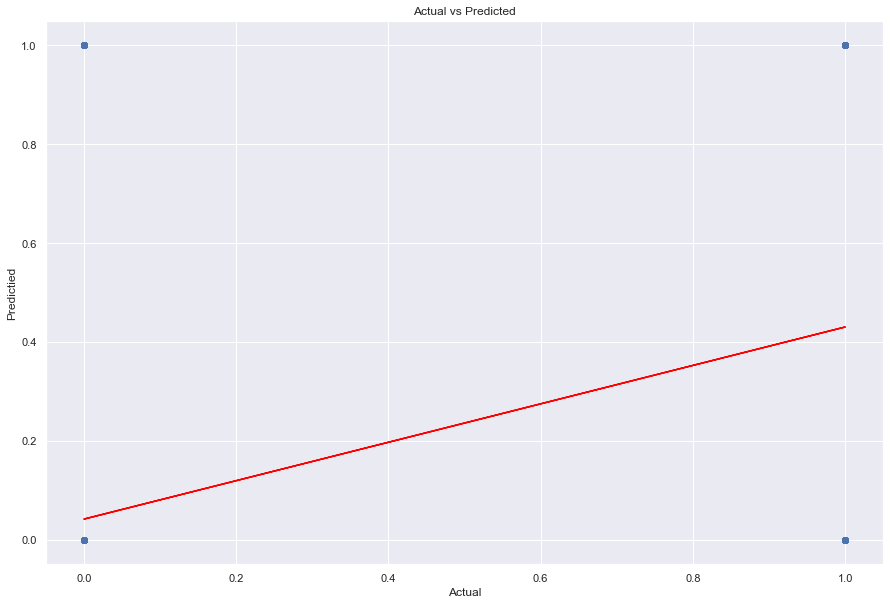

In [83]:
plt.figure(figsize=(15,10))
plt.scatter(y_test, y_pred)
slope, intercept = np.polyfit(y_test, y_pred, 1)
plt.plot(y_pred, slope*y_pred + intercept, color='red')
plt.xlabel('Actual')
plt.ylabel('Predictied')
plt.title('Actual vs Predicted')

plt.show()

# 

## Step 2 Training the Decision Model

In [89]:
decision_tree_model = DecisionTreeClassifier()


In [90]:
decision_tree_model.fit(X_train, y_train)


DecisionTreeClassifier()

In [91]:
y_pred_dt = decision_tree_model.predict(X_test)


In [92]:
accuracy_decision_tree = accuracy_score(y_test,y_pred_dt)

In [93]:
print(accuracy_decision_tree)

0.93137303762771


In [94]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96     16264
           1       0.81      0.83      0.82      3801

    accuracy                           0.93     20065
   macro avg       0.89      0.89      0.89     20065
weighted avg       0.93      0.93      0.93     20065



In [95]:
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred_dt)

# Print the confusion matrix
print('Confusion matrix:\n', cm)

Confusion matrix:
 [[15522   742]
 [  635  3166]]


In [96]:
cross_val_score(decision_tree_model, X_train, y_train, cv=10)

array([0.93272106, 0.92439129, 0.92375053, 0.93143956, 0.93314823,
       0.92930372, 0.92909013, 0.9299295 , 0.92330699, 0.92928861])

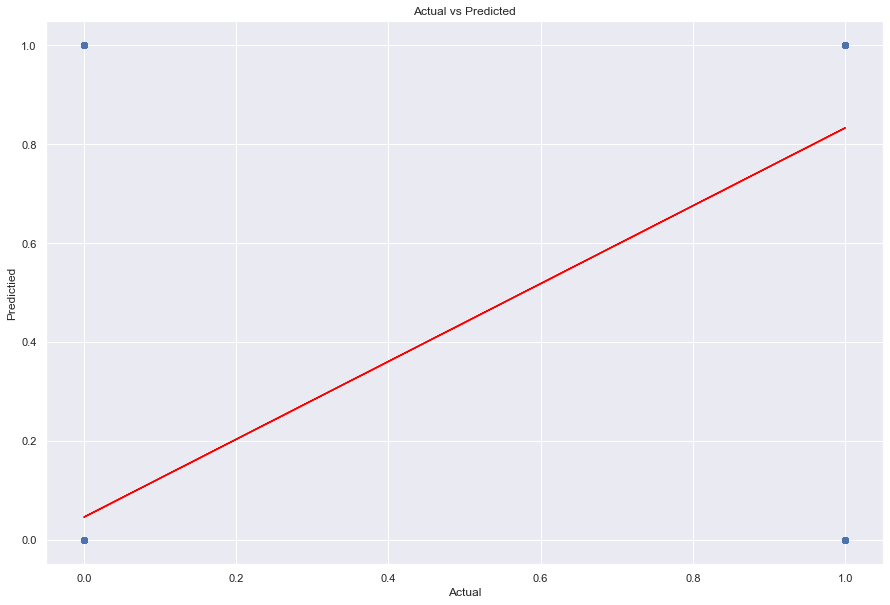

In [98]:
plt.figure(figsize=(15,10))
plt.scatter(y_test, y_pred_dt)
slope, intercept = np.polyfit(y_test, y_pred_dt, 1)
plt.plot(y_pred_dt, slope*y_pred_dt + intercept, color='red')
plt.xlabel('Actual')
plt.ylabel('Predictied')
plt.title('Actual vs Predicted')

plt.show()

# 

# D. Model Assessment. (Which evaluation metric is appropriate for model evaluation in the selected business scenario?)

In this type of business scenario to evaluate metrics classification instances, the accuracy is the ideal metric in thi situation. It is commoly used from classification models, however, it can not be rely on if the classes are imbalanced. Optional metrics can be used if the classes are imbalanced, such as precision and recall in this case. Precision is used to measures the proportion of true positive instances in our case they are the(high average daily rate), while the recall measures the proportion of true positives classifications among all actual high-rate instances. Another evaluation metric for classification problems, which is quite common used is the F1 score metric. The F1 score is used when the classes are imbalanced such as precision and recall. It takes the false positives and falso negatives into account and correct them to be more accurately.  

# E. Model Comparison. (Which of the two models (Logistic Regression or Decision Tree Classification do you think should be used in practice?)

In [105]:
##Evaluate the model on the test set
print('Logistic Regression Model')
print( classification_report(y_test,y_pred));
print('Decision Tree Classification Model')
print( classification_report(y_test, y_pred_dt))

Logistic Regression Model
              precision    recall  f1-score   support

           0       0.88      0.96      0.92     16264
           1       0.71      0.43      0.54      3801

    accuracy                           0.86     20065
   macro avg       0.79      0.69      0.73     20065
weighted avg       0.85      0.86      0.84     20065

Decision Tree Classification Model
              precision    recall  f1-score   support

           0       0.96      0.95      0.96     16264
           1       0.81      0.83      0.82      3801

    accuracy                           0.93     20065
   macro avg       0.89      0.89      0.89     20065
weighted avg       0.93      0.93      0.93     20065



In this particular business scenario, the Decision Tree Classification Model has demonstrated superior performance to the Logistic Regression Model in terms of precision, recall, F1-score, and accuracy.

It is crucial to keep in mind that imbalanced classes can pose a significant challenge for machine learning models. As a result, even though a model may achieve high accuracy on the majority classes, its performance on the minority classes may be poor.


# 